#Выпускная квалификационная работа. Курс «Data Science»

In [ ]:
#Работа выполнена в Google Colab

# Импорт необходимых библиотек

In [1]:
import pandas as pd
import numpy as np
import sklearn as sk
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from pandas.plotting import scatter_matrix
from sklearn.neighbors import LocalOutlierFactor
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_validate
from sklearn.linear_model import Lasso
from tensorflow import keras
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import layers
import pickle

#Загрузка исследуемых данных


### Загрузка файла x_bp

In [2]:
df_x_bp = pd.read_excel('X_bp.xlsx')
df_x_bp = df_x_bp.astype({'Unnamed: 0':'int'})
df_x_bp.head(3)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0


### Загрузка файла x_nup

In [3]:
df_x_nup = pd.read_excel('X_nup.xlsx')
df_x_nup = df_x_nup.astype({'Unnamed: 0':'int','Угол нашивки, град':'int'})
df_x_nup.head(3)

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4.0,57.0
1,1,0,4.0,60.0
2,2,0,4.0,70.0


### Оценка датасетов по индексу

In [4]:
print(df_x_bp.index, df_x_nup.index)

RangeIndex(start=0, stop=1023, step=1) RangeIndex(start=0, stop=1040, step=1)


# Объединение производится по индексу. Тип объединения INNER

In [5]:
dataset = pd.merge(df_x_bp, df_x_nup, how='inner', on='Unnamed: 0')
dataset = dataset.drop(labels = 'Unnamed: 0', axis = 1)
dataset.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0


# Разведочный анализ данных

In [6]:
print(dataset.shape)

(1023, 13)


In [ ]:
dataset.index

Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022],
           dtype='int64', length=1023)

In [ ]:
dataset.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [ ]:

results_dataset = dataset.describe()
display(results_dataset.T)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [ ]:
dataset.median() #медиана

Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Температура вспышки, С_2                 285.896812
Поверхностная плотность, г/м2            451.864365
Модуль упругости при растяжении, ГПа      73.268805
Прочность при растяжении, МПа           2459.524526
Потребление смолы, г/м2                  219.198882
Угол нашивки, град                         0.000000
Шаг нашивки                                6.916144
Плотность нашивки                         57.341920
dtype: float64

In [ ]:
dataset.mean() # среднее значение

Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Угол нашивки, град                        44.252199
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
dtype: float64

In [ ]:
dataset.nunique() #количество уникальных значений

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [ ]:
dataset.info() #количество пропусков и нулевых значений

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

# Гистограммы распределения переменных

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd00305b150>,
      dtype=object)

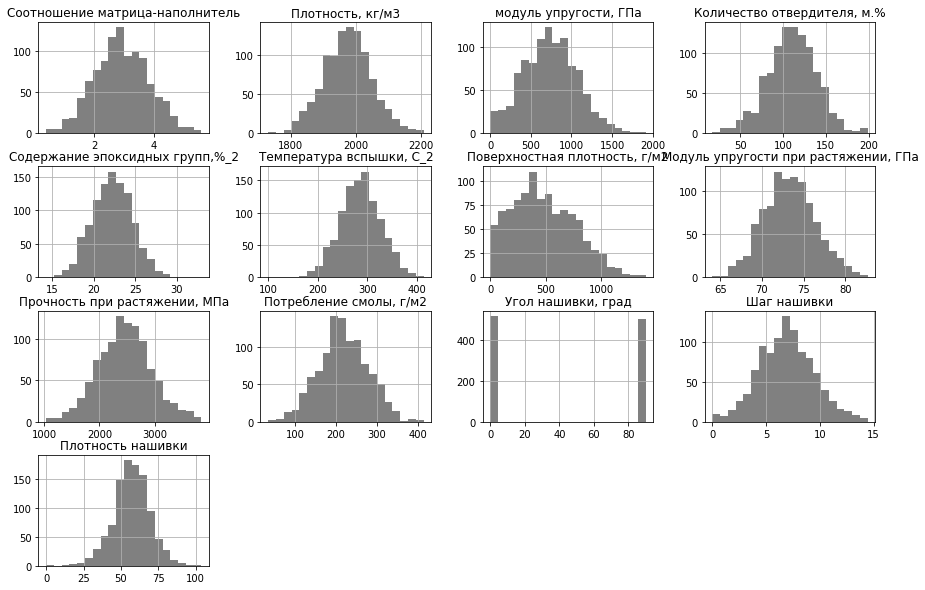

In [ ]:
dataset.hist(figsize = (15, 10), bins = 20, color = 'grey')

# Диаграммы размаха (ящики с усами) по каждой переменной

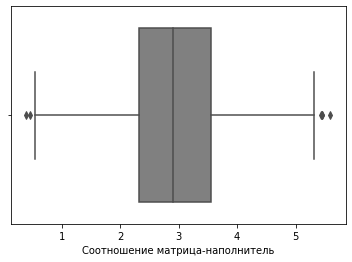

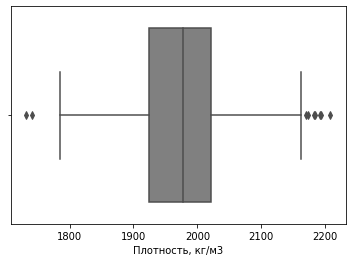

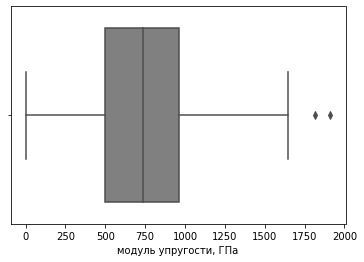

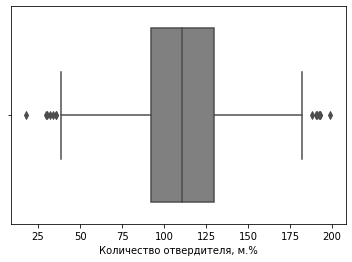

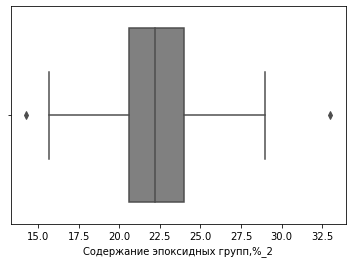

...

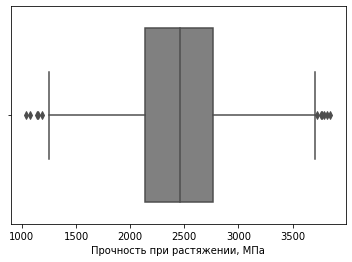

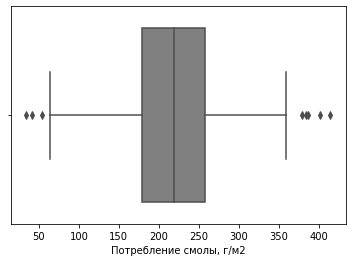

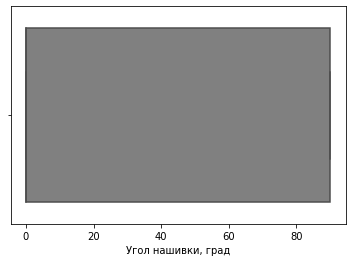

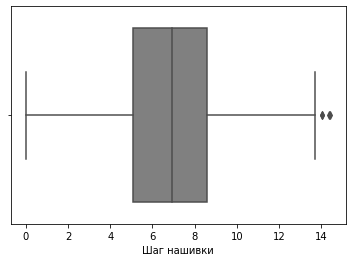

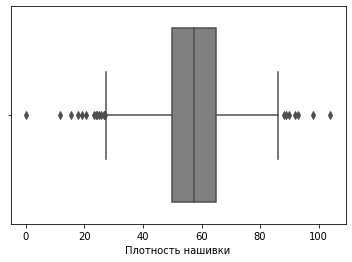

In [ ]:
#fig = plt.figure(figsize=(17, 32))
for i in dataset.columns:
    sns.boxplot(x = dataset[i], color = 'grey')
    plt.show()

# Попарные диаграммы рассеяния

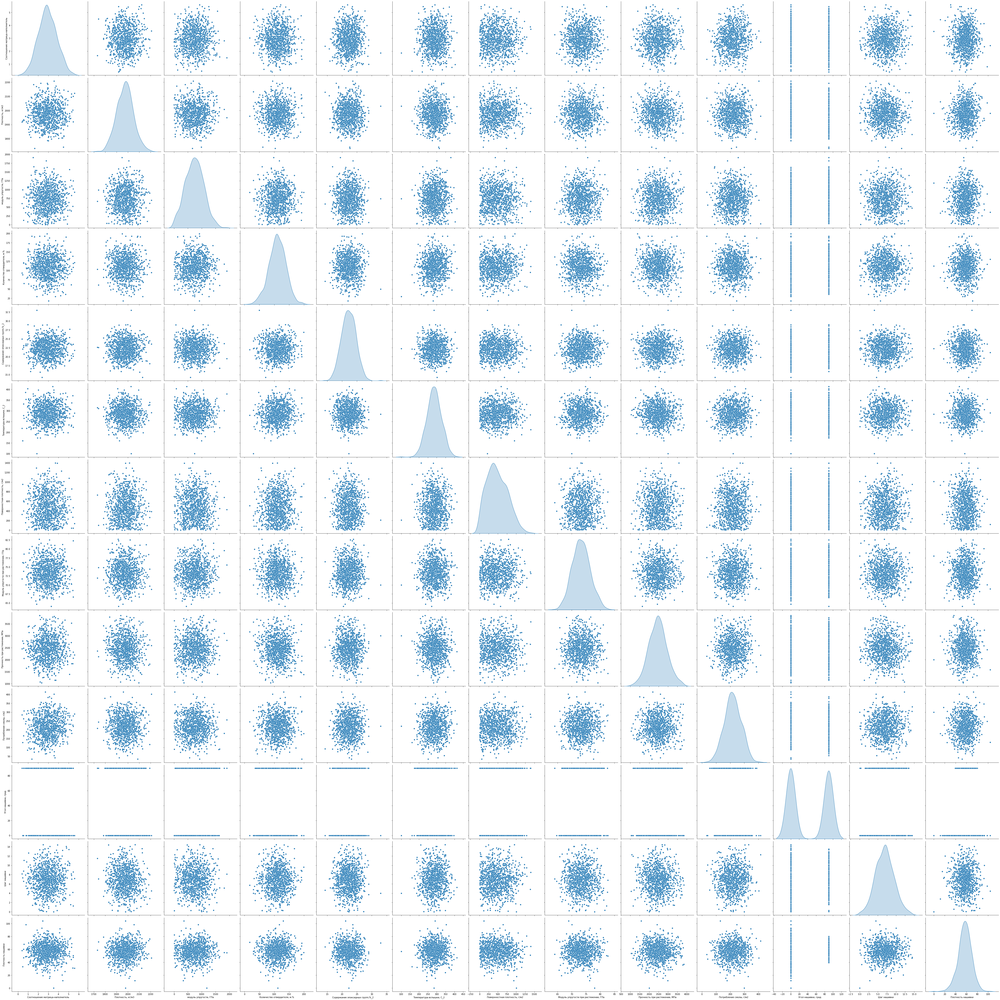

In [ ]:
sns.pairplot(dataset, diag_kind='kde', height= 5, palette = 'grey' ); #, size=4, diag_kind='kde'{'scatter', 'kde', 'hist', 'reg'}

<function matplotlib.pyplot.show(*args, **kw)>

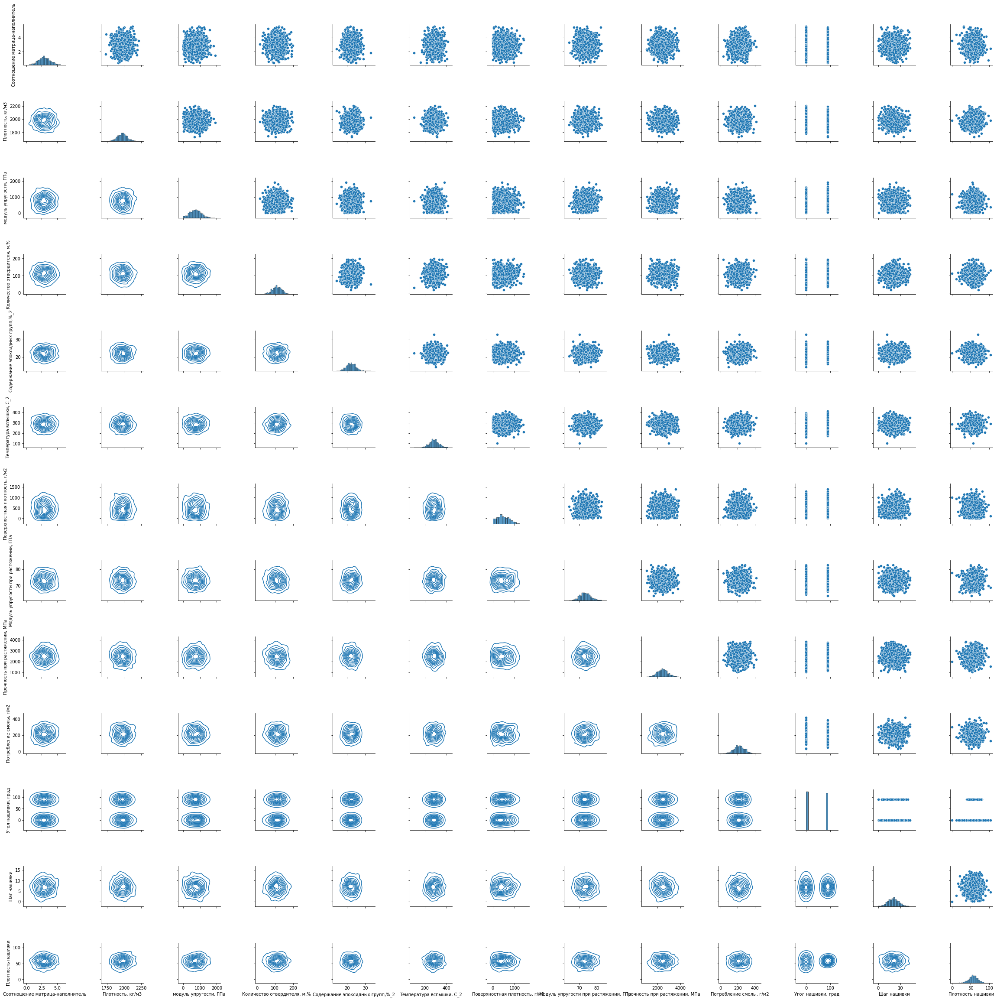

In [ ]:
g= sns.PairGrid(dataset)
g.map_diag(sns.histplot)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
plt.show

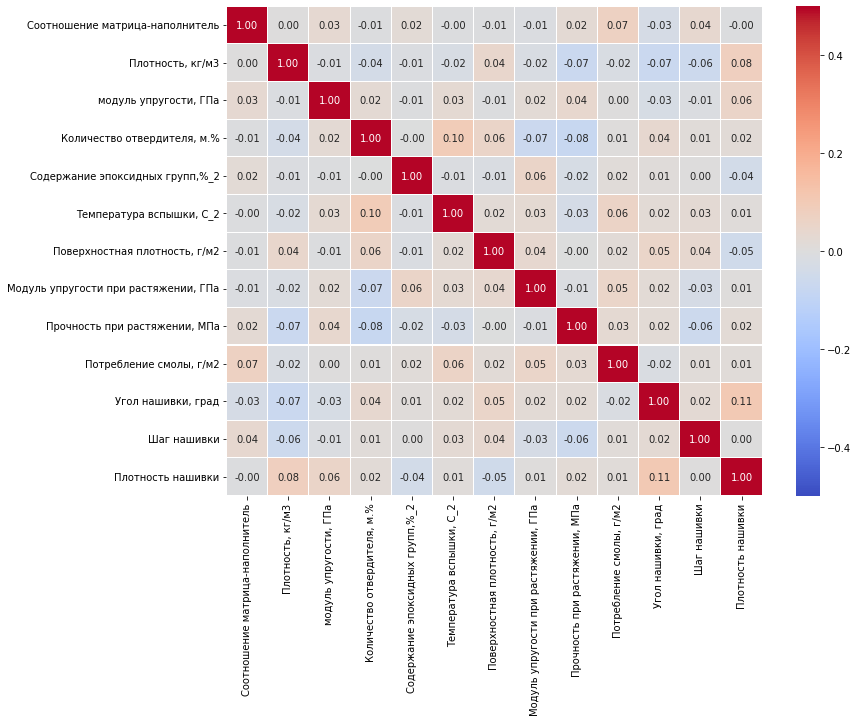

In [ ]:
cor_map = dataset.corr()
fig, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(cor_map, vmin=-0.5, vmax=0.5, annot=True, fmt='.2f',cmap='coolwarm', ax=ax, linewidths = 0.1) #'RdBu_r' 'coolwarm' 'Greys'
plt.show()

# Сравнение методов удаления выбросов

### Поиск выбросов с помощью метода трех сигм

In [ ]:
sgm = 0
for i in dataset:
    d = dataset.loc[:, [i]]
    # методом 3-х сигм
    zscore = (dataset[i] - dataset[i].mean()) / dataset[i].std()
    d['3s'] = zscore.abs() > 3
    sgm += d['3s'].sum()
print( 'Кол-во выбросов методом трех сигм:', sgm)


Кол-во выбросов методом трех сигм: 24


In [ ]:
temp_dataFrame = dataset.copy()
for i in dataset.columns:
    temp_dataFrame[i] = abs((dataset[i] - dataset[i].mean()) / dataset[i].std())
    print(f"{sum(temp_dataFrame[i] > 3)} -> выбросов в признаке: '{i}'")
print(f' Итого:  {sum(sum(temp_dataFrame.values > 3))} выброса')

0 -> выбросов в признаке: 'Соотношение матрица-наполнитель'
3 -> выбросов в признаке: 'Плотность, кг/м3'
2 -> выбросов в признаке: 'модуль упругости, ГПа'
2 -> выбросов в признаке: 'Количество отвердителя, м.%'
2 -> выбросов в признаке: 'Содержание эпоксидных групп,%_2'
3 -> выбросов в признаке: 'Температура вспышки, С_2'
2 -> выбросов в признаке: 'Поверхностная плотность, г/м2'
0 -> выбросов в признаке: 'Модуль упругости при растяжении, ГПа'
0 -> выбросов в признаке: 'Прочность при растяжении, МПа'
3 -> выбросов в признаке: 'Потребление смолы, г/м2'
0 -> выбросов в признаке: 'Угол нашивки, град'
0 -> выбросов в признаке: 'Шаг нашивки'
7 -> выбросов в признаке: 'Плотность нашивки'
 Итого:  24 выброса


### Поиск выбросов с помощью многомерного LocalOutlierFactor

In [9]:
lof = LocalOutlierFactor(n_neighbors = 300)
lof_pred = lof.fit_predict(dataset)
outlier_indexes = []
for i in range(len(lof_pred)):
    if lof_pred[i] == -1:
        outlier_indexes.append(i)
print('Кол-во выбросов методом LOF: ' + str(len(outlier_indexes)))
dataset.loc[outlier_indexes]

Кол-во выбросов методом LOF: 27


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
11,2.877358,1990.000000,1628.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0,9.000000,47.000000
24,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,1,5.000000,47.000000
37,5.098993,1977.339047,1572.096042,132.343060,25.397001,286.556431,690.364836,72.341640,1386.578973,271.901394,1,10.000000,57.000000
77,2.965812,1952.017898,105.154467,104.486677,23.898728,308.473989,808.806264,75.825484,1400.357932,300.499628,0,11.644048,34.929572
94,1.620930,2110.566437,124.133740,191.053004,21.590295,280.120468,4.099043,72.680412,1461.448845,171.988605,0,7.388167,45.459778
99,3.952834,1931.687894,348.354645,108.403571,22.951690,208.041941,97.545358,71.807955,3725.190760,134.392555,0,4.402248,48.959084
106,2.334566,2020.976475,1013.513596,109.505135,24.330905,266.258622,719.870002,68.166534,3773.151949,264.835584,0,7.363599,69.172337
113,3.108043,1879.000705,1106.825749,157.076488,17.089228,305.658635,1227.243097,72.625213,1529.604423,208.945212,0,9.453269,52.391669
172,3.441706,1839.864649,935.511792,99.079859,20.715839,330.371637,556.153263,76.632138,3791.072810,284.852950,0,7.208147,35.768811
185,2.152055,1938.282144,1065.625743,148.104233,19.093392,234.856713,865.629036,72.299462,3848.436732,143.123640,0,5.783165,36.911051


In [ ]:
dataset.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

# Cтолбец "Угол нашивки" кодируем с помощью LabelEncoder

In [7]:
le = LabelEncoder()
dataset['Угол нашивки, град'] = le.fit_transform(dataset['Угол нашивки, град'])

#Удаление выбросов

In [ ]:
#Удаление выбросов

In [10]:
dataset_drop = dataset
dataset.drop(outlier_indexes, inplace = True, errors='ignore')
dataset.drop(outlier_indexes, inplace = True, errors='ignore')
dataset_drop  

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f819657e690>,
      dtype=object)

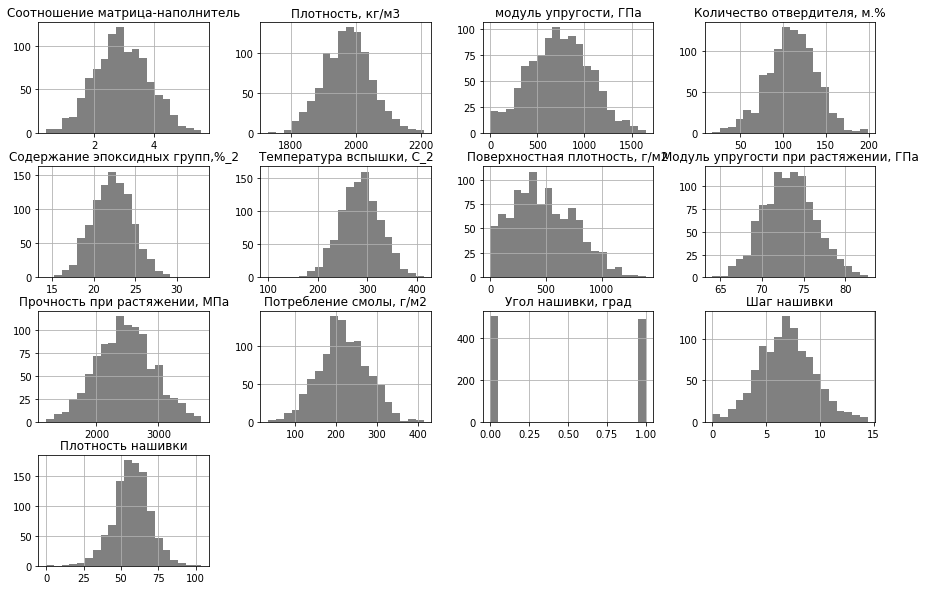

In [11]:
dataset_drop.hist(figsize = (15, 10), bins = 20, color = 'grey')

# Диаграммы размаха (ящики с усами) по каждой переменной после удаления выбросов

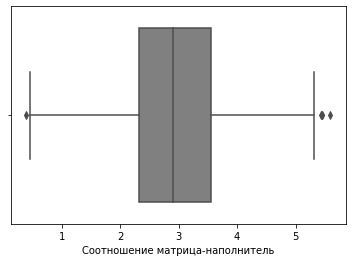

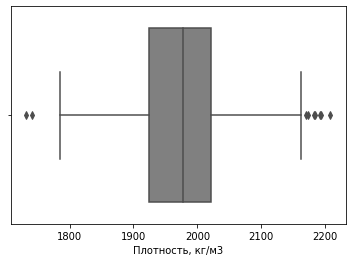

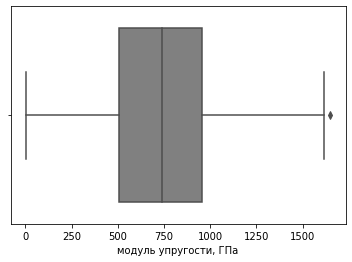

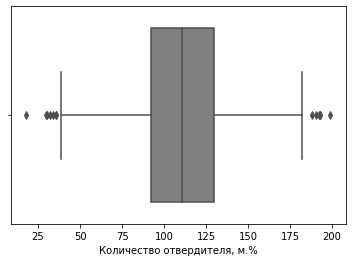

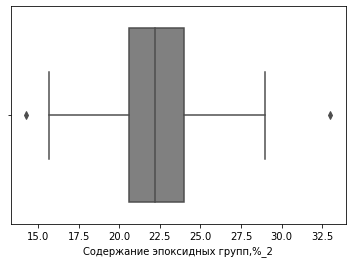

...

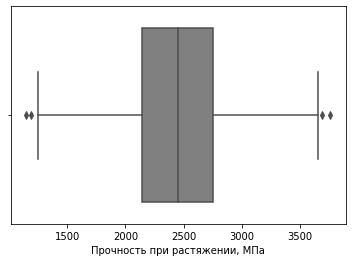

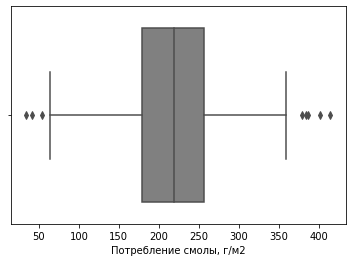

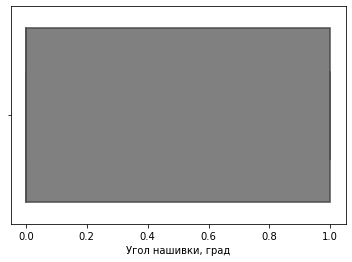

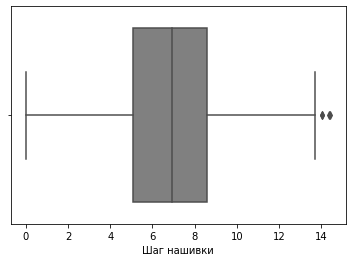

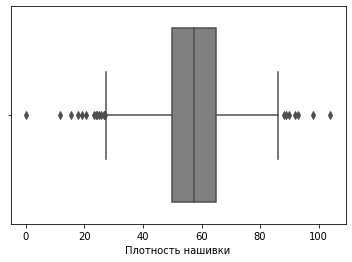

In [ ]:
for i in dataset_drop.columns:
    sns.boxplot(x = dataset[i], color = 'grey')
    plt.show()

# Корреляционная матрицы после удаления выбросов

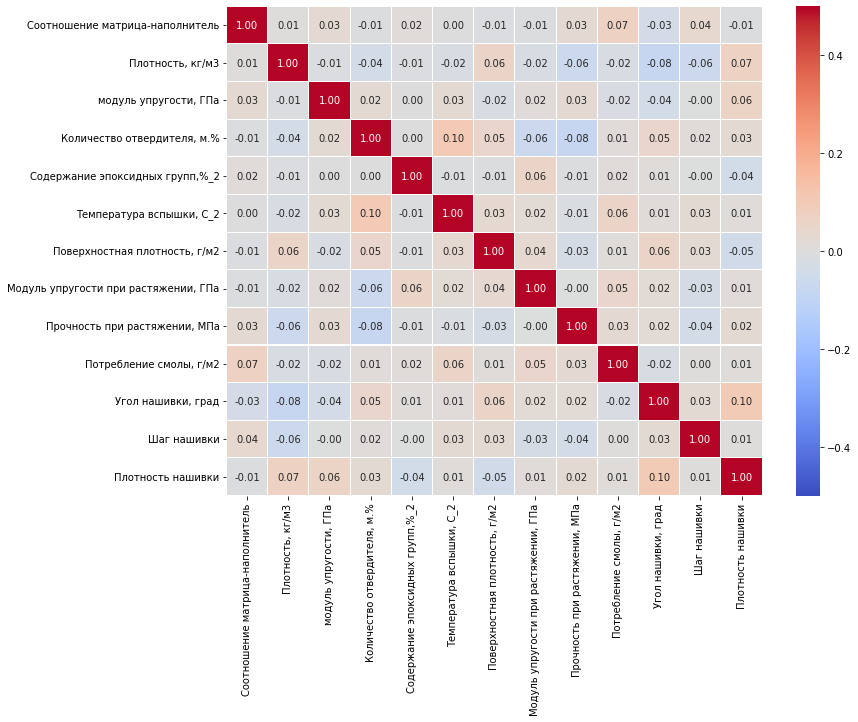

In [ ]:
cor_map = dataset_drop.corr()
fig, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(cor_map, vmin=-0.5, vmax=0.5, annot=True, fmt='.2f',cmap='coolwarm', ax=ax, linewidths = 0.1)
plt.show()

# Нормализация

In [ ]:
scaler = preprocessing.MinMaxScaler()
names = dataset_drop.columns
d = scaler.fit_transform(dataset_drop)
dataset_drop_normalized = pd.DataFrame(d, columns=names).round(2)
dataset_drop_normalized.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.28,0.63,0.45,0.07,0.43,0.00,0.15,0.32,0.71,0.49,0.0,0.28,0.55
1,0.28,0.63,0.45,0.18,0.51,0.59,0.15,0.32,0.71,0.49,0.0,0.28,0.58
2,0.28,0.63,0.45,0.18,1.00,0.59,0.15,0.32,0.71,0.49,0.0,0.28,0.67
3,0.28,0.63,0.45,0.61,0.37,0.64,0.15,0.32,0.71,0.49,0.0,0.35,0.45
4,0.46,0.63,0.46,0.52,0.43,0.59,0.15,0.32,0.71,0.49,0.0,0.35,0.55


In [ ]:
results_dataset_normalized = dataset_drop_normalized.describe()
display(results_dataset_normalized.T)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,999.0,0.489049,0.176110,0.0,0.37,0.48,0.61,1.0
"Плотность, кг/м3",999.0,0.512272,0.154870,0.0,0.40,0.52,0.61,1.0
"модуль упругости, ГПа",999.0,0.446787,0.194792,0.0,0.31,0.45,0.58,1.0
"Количество отвердителя, м.%",999.0,0.511491,0.156458,0.0,0.41,0.51,0.62,1.0
"Содержание эпоксидных групп,%_2",999.0,0.426356,0.128291,0.0,0.34,0.43,0.52,1.0
"Температура вспышки, С_2",999.0,0.593413,0.129980,0.0,0.51,0.59,0.68,1.0
"Поверхностная плотность, г/м2",999.0,0.344605,0.199871,0.0,0.19,0.32,0.50,1.0
"Модуль упругости при растяжении, ГПа",999.0,0.497317,0.168109,0.0,0.38,0.50,0.61,1.0
"Прочность при растяжении, МПа",999.0,0.502563,0.175095,0.0,0.38,0.50,0.61,1.0
"Потребление смолы, г/м2",999.0,0.484024,0.156591,0.0,0.38,0.48,0.59,1.0


#Стандартизация

In [ ]:
def scale(scaler, df):
    scaler.fit(df)
    df_scaled = pd.DataFrame(scaler.transform(df.values))
    df_scaled.columns = df.columns
    return scaler, df_scaled

In [ ]:
standard_scaler_inputs, dataset_drop_standartized = scale(scaler = preprocessing.StandardScaler(),
                                                         df = dataset_drop)
dataset_drop_standartized.head()

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  "X does not have valid feature names, but"


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,-1.175402,0.737967,0.001648,-2.838348,0.008946,-4.564637,-0.972346,-1.060957,1.175857,0.032089,-0.985096,-1.125767,-0.018815
1,-1.175402,0.737967,0.001648,-2.132473,0.625410,-0.031175,-0.972346,-1.060957,1.175857,0.032089,-0.985096,-1.125767,0.223990
2,-1.175402,0.737967,0.001648,-2.136002,4.472735,-0.031175,-0.972346,-1.060957,1.175857,0.032089,-0.985096,-1.125767,1.033343
3,-1.175402,0.737967,0.001648,0.655732,-0.414408,0.346613,-0.972346,-1.060957,1.175857,0.032089,-0.985096,-0.734548,-0.828168
4,-0.176207,0.737967,0.046143,0.050797,0.008946,-0.031175,-0.972346,-1.060957,1.175857,0.032089,-0.985096,-0.734548,-0.018815


In [ ]:
results_dataset_standartized = dataset_drop_standartized.describe()
display(results_dataset_standartized.T)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,999.0,-4.214180e-16,1.000501,-2.779621,-0.671815,-0.025918,0.680288,2.906462
"Плотность, кг/м3",999.0,-1.991511e-16,1.000501,-3.307918,-0.704025,0.027398,0.620951,3.149656
"модуль упругости, ГПа",999.0,5.512218e-17,1.000501,-2.295278,-0.722328,0.002336,0.682342,2.842558
"Количество отвердителя, м.%",999.0,-1.635884e-16,1.000501,-3.271039,-0.646171,0.005086,0.678758,3.124641
"Содержание эпоксидных групп,%_2",999.0,-7.250345e-16,1.000501,-3.323824,-0.681419,-0.006475,0.713365,4.472735
"Температура вспышки, С_2",999.0,9.495241e-16,1.000501,-4.564637,-0.658560,-0.001813,0.665896,3.128184
"Поверхностная плотность, г/м2",999.0,3.556270e-17,1.000501,-1.726549,-0.767704,-0.103196,0.755141,3.281497
"Модуль упругости при растяжении, ГПа",999.0,5.832283e-16,1.000501,-2.962664,-0.676744,0.005153,0.645903,2.995181
"Прочность при растяжении, МПа",999.0,8.499485e-16,1.000501,-2.870987,-0.692446,-0.010751,0.635356,2.839774
"Потребление смолы, г/м2",999.0,8.712861e-17,1.000501,-3.094639,-0.649745,0.006043,0.655210,3.299769


# Разделение датасета на входные и выходные параметры для моделей


Нормализованный датасет

In [ ]:
output_df_elastic_norm = dataset_drop_normalized['Модуль упругости при растяжении, ГПа']
output_df_strength_norm = dataset_drop_normalized['Прочность при растяжении, МПа']

input_df_elastic_norm = dataset_drop_normalized.loc[:, dataset_drop_normalized.columns != 'Модуль упругости при растяжении, ГПа']
input_df_strength_norm = dataset_drop_normalized.loc[:, dataset_drop_normalized.columns != 'Прочность при растяжении, МПа']


In [ ]:
X_input_elastic_norm, X_output_elastic_norm,  y_input_elastic_norm, y_output_elastic_norm = train_test_split(input_df_elastic_norm, output_df_elastic_norm , test_size=0.3, random_state=42)
X_input_strength_norm, X_output_strength_norm, y_input_strength_norm, y_output_strength_norm = train_test_split(input_df_strength_norm, output_df_strength_norm, test_size=0.3, random_state=42)



In [ ]:
dataset_drop_normalized.shape[0] - X_input_elastic_norm.shape[0] - X_output_elastic_norm.shape[0]
dataset_drop_normalized.shape[0] - X_input_strength_norm.shape[0] - X_output_strength_norm.shape[0]

0

In [ ]:
X_output_elastic_norm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
453,0.41,0.48,0.26,0.59,0.54,0.88,0.63,0.53,0.77,0.0,0.19,0.72
793,0.41,0.37,0.53,0.74,0.41,0.62,0.37,0.27,0.51,1.0,0.35,0.64
209,0.38,0.41,0.56,0.38,0.56,0.55,0.19,0.66,0.63,0.0,0.44,0.44
309,0.25,0.62,0.59,0.57,0.38,0.54,0.49,0.29,0.62,0.0,0.43,0.34
740,0.62,0.70,0.61,0.39,0.40,0.47,0.56,0.45,0.27,1.0,0.51,0.53
...,...,...,...,...,...,...,...,...,...,...,...,...
314,0.50,0.11,0.59,0.35,0.29,0.70,0.18,0.87,0.48,0.0,0.23,0.46
404,0.57,0.26,0.44,0.67,0.37,0.54,0.39,0.33,0.34,0.0,0.54,0.58
7,0.42,0.35,0.32,0.52,0.43,0.59,0.27,0.25,0.23,0.0,0.48,0.45
155,0.38,0.42,0.40,0.44,0.42,0.62,0.54,0.45,0.32,0.0,0.29,0.28


Стандартизированный датасет

In [ ]:
output_df_elastic_standart = dataset_drop_standartized['Модуль упругости при растяжении, ГПа']
output_df_strength_standart = dataset_drop_standartized['Прочность при растяжении, МПа']

input_df_elastic_standart = dataset_drop_standartized.loc[:, dataset_drop_standartized.columns != 'Модуль упругости при растяжении, ГПа']
input_df_strength_standart = dataset_drop_standartized.loc[:, dataset_drop_standartized.columns != 'Прочность при растяжении, МПа']

In [ ]:
X_input_elastic_standart, X_output_elastic_standart,  y_input_elastic_standart, y_output_elastic_standart = train_test_split(input_df_elastic_standart, output_df_elastic_standart , test_size=0.3, random_state=42)
X_input_strength_standart, X_output_strength_standart, y_input_strength_standart, y_output_strength_standart = train_test_split(input_df_strength_standart, output_df_strength_standart, test_size=0.3, random_state=42)

In [ ]:
dataset_drop_standartized.shape[0] - X_input_elastic_standart.shape[0] - X_output_elastic_standart.shape[0]
dataset_drop_standartized.shape[0] - X_input_strength_standart.shape[0] - X_output_strength_standart.shape[0]

0

In [ ]:
X_output_elastic_standart

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
453,-0.420874,-0.202845,-0.959132,0.522801,0.919986,2.236920,1.446728,0.164520,1.824729,-0.985096,-1.594965,1.420451
793,-0.430262,-0.911753,0.433728,1.485256,-0.105393,0.236836,0.102652,-1.332434,0.162725,1.015129,-0.722636,0.757084
209,-0.617594,-0.664813,0.607049,-0.834452,1.066370,-0.335088,-0.766536,0.922245,0.903855,-0.985096,-0.195379,-0.902880
309,-1.333185,0.681328,0.720977,0.405918,-0.374108,-0.388041,0.728455,-1.241173,0.838783,-0.985096,-0.271399,-1.733343
740,0.757591,1.187400,0.830943,-0.753350,-0.167192,-0.951019,1.080138,-0.281049,-1.348917,1.015129,0.208054,-0.148073
...,...,...,...,...,...,...,...,...,...,...,...,...
314,0.068396,-2.592747,0.741325,-1.022781,-1.055096,0.784128,-0.844101,2.107205,-0.039412,-0.985096,-1.397994,-0.788687
404,0.447419,-1.622671,-0.060102,1.035892,-0.429687,-0.389652,0.249044,-1.012290,-0.906628,-0.985096,0.370000,0.254048
7,-0.405576,-1.025623,-0.633919,0.050797,0.008946,-0.031175,-0.360040,-1.439524,-1.647169,-0.985096,0.047889,-0.828168
155,-0.619575,-0.605658,-0.250474,-0.439220,-0.044034,0.220532,0.974153,-0.291772,-1.064293,-0.985096,-1.028983,-2.304653


In [ ]:
errors_df = pd.DataFrame(columns=['model_name','target_value','MSE','R2'])

#Линейная регрессия

In [ ]:
#Линейная регрессия

In [ ]:
# модуль упругости при растяжении

linear_model_elastic_norm = LinearRegression()
linear_model_elastic_norm.fit(X_input_elastic_norm,  y_input_elastic_norm)
prediction_y_test_linear_1 = linear_model_elastic_norm.predict(X_output_elastic_norm)


MSE_elastic_norm = mean_squared_error(y_output_elastic_norm, prediction_y_test_linear_1)
R2_elastic_norm = r2_score(y_output_elastic_norm, prediction_y_test_linear_1)

# прочность при растяжении
linear_model_pro = LinearRegression()
linear_model_pro.fit(X_input_strength_norm, y_input_strength_norm)
prediction_y_test_linear_2 = linear_model_pro.predict(X_output_strength_norm)

MSE_strength_norm = mean_squared_error(y_output_strength_norm, prediction_y_test_linear_2)
R2_strength_norm = r2_score(y_output_strength_norm, prediction_y_test_linear_2)


linear_errors = pd.DataFrame({'model_name':'Linear Regression_norm',\
                                'target_value':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_elastic_norm, MSE_strength_norm],\
                               'R2':[R2_elastic_norm, R2_strength_norm]})
errors_df = pd.concat([errors_df, linear_errors], ignore_index=True)
errors_df

,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",0.030016,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",0.033335,-0.010481


In [ ]:
# модуль упругости при растяжении

linear_model_elastic_standart = LinearRegression()
linear_model_elastic_standart.fit(X_input_elastic_standart,  y_input_elastic_standart)
prediction_y_test_linear_standart_1 = linear_model_elastic_standart.predict(X_output_elastic_standart)


MSE_elastic_standart = mean_squared_error(y_output_elastic_standart, prediction_y_test_linear_standart_1)
R2_elastic_standart = r2_score(y_output_elastic_standart, prediction_y_test_linear_standart_1)

# прочность при растяжении
linear_model_pro_standart = LinearRegression()
linear_model_pro_standart.fit(X_input_strength_standart, y_input_strength_standart)
prediction_y_test_linear_standart_2 = linear_model_pro.predict(X_output_strength_standart)

MSE_strength_standart = mean_squared_error(y_output_strength_standart, prediction_y_test_linear_standart_2)
R2_strength_standart = r2_score(y_output_strength_standart, prediction_y_test_linear_standart_2)


linear_errors = pd.DataFrame({'model_name':'Linear Regression_standart',\
                                'target_value':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_elastic_standart, MSE_strength_standart],\
                               'R2':[R2_elastic_standart, R2_strength_standart]})
errors_df = pd.concat([errors_df, linear_errors], ignore_index=True)
errors_df

,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",0.030016,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",0.033335,-0.010481
2,Linear Regression_standart,"Модуль упругости при растяжении, ГПа",1.061043,-0.004209
3,Linear Regression_standart,"Прочность при растяжении, МПа",1.317042,-0.222225


#Случайный лес

In [ ]:
#Случайный лес

In [ ]:
rfr_model_norm = RandomForestRegressor(random_state=14)
rfr_model_norm_params = {
    'n_estimators' : range(1, 100, 5),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : range(1, 5, 1),
    'criterion':['mse']
}
GSCV_rfr_model_upr_norm = GridSearchCV(rfr_model_norm, rfr_model_norm_params, cv=5, verbose=2)
GSCV_rfr_model_upr_norm.fit(X_input_elastic_norm,  y_input_elastic_norm)
# GSCV_rfr_model_upr.best_params_
rfr_model_upr_norm = GSCV_rfr_model_upr_norm.best_estimator_

MSE_upr_norm = mean_squared_error(y_output_elastic_norm, rfr_model_upr_norm.predict(X_output_elastic_norm))
R2_upr_norm = r2_score(y_output_elastic_norm, rfr_model_upr_norm.predict(X_output_elastic_norm))

GSCV_rfr_model_pro_norm = GridSearchCV(rfr_model_norm, rfr_model_norm_params, cv=5, verbose=2)
GSCV_rfr_model_pro_norm.fit(X_input_strength_norm, y_input_strength_norm)
# GSCV_rfr_model_pro.best_params_
rfr_model_pro_norm = GSCV_rfr_model_upr_norm.best_estimator_

MSE_pro_norm = mean_squared_error(y_output_strength_norm, rfr_model_upr_norm.predict(X_output_strength_norm))
R2_pro_norm = r2_score(y_output_strength_norm, rfr_model_upr_norm.predict(X_output_strength_norm))

rf_errors = pd.DataFrame({'model_name':'RandomForestRegressor_norm',\
                                'target_value':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr_norm, MSE_pro_norm],\
                               'R2':[R2_upr_norm, R2_pro_norm]})
errors_df = pd.concat([errors_df, rf_errors], ignore_index=True)
errors_df

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, ma

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.3s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=  

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- Модуль упругости при растяжении, ГПа
Feature names seen at fit time, yet now missing:
- Прочность при растяжении, МПа

  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- Модуль упругости при растяжении, ГПа
Feature names seen at fit time, yet now missing:
- Прочность при растяжении, МПа

  warnings.warn(message, FutureWarning)


,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",0.030016,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",0.033335,-0.010481
2,Linear Regression_standart,"Модуль упругости при растяжении, ГПа",1.061043,-0.004209
3,Linear Regression_standart,"Прочность при растяжении, МПа",1.317042,-0.222225
4,RandomForestRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029957,-0.002522
5,RandomForestRegressor_norm,"Прочность при растяжении, МПа",0.033039,-0.001506


In [ ]:
rfr_model_standart = RandomForestRegressor(random_state=14)
rfr_model_standart_params = {
    'n_estimators' : range(1, 100, 5),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : range(1, 5, 1),
    'criterion':['mse']
}
GSCV_rfr_model_upr_standart = GridSearchCV(rfr_model_standart, rfr_model_standart_params, cv=5, verbose=2)
GSCV_rfr_model_upr_standart.fit(X_input_elastic_standart,  y_input_elastic_standart)
# GSCV_rfr_model_upr.best_params_
rfr_model_upr_standart = GSCV_rfr_model_upr_standart.best_estimator_

MSE_upr_standart = mean_squared_error(y_output_elastic_standart, rfr_model_upr_standart.predict(X_output_elastic_standart))
R2_upr_standart = r2_score(y_output_elastic_standart, rfr_model_upr_standart.predict(X_output_elastic_standart))

GSCV_rfr_model_pro_standart = GridSearchCV(rfr_model_standart, rfr_model_standart_params, cv=5, verbose=2)
GSCV_rfr_model_pro_standart.fit(X_input_strength_standart, y_input_strength_standart)
# GSCV_rfr_model_pro.best_params_
rfr_model_pro_standart = GSCV_rfr_model_upr_standart.best_estimator_

MSE_pro_standart = mean_squared_error(y_output_strength_standart, rfr_model_upr_standart.predict(X_output_strength_standart))
R2_pro_standart = r2_score(y_output_strength_standart, rfr_model_upr_standart.predict(X_output_strength_standart))

rf_errors = pd.DataFrame({'model_name':'RandomForestRegressor_standart',\
                                'target_value':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr_standart, MSE_pro_standart],\
                               'R2':[R2_upr_standart, R2_pro_standart]})
errors_df = pd.concat([errors_df, rf_errors], ignore_index=True)
errors_df



/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, ma

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time= 

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.4s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.4s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.4s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.4s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.4s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.4s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.4s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.3s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.3s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.3s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: 

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.2s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.3s


/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- Модуль упругости при растяжении, ГПа
Feature names seen at fit time, yet now missing:
- Прочность при растяжении, МПа

  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- Модуль упругости при растяжении, ГПа
Feature names seen at fit time, yet now missing:
- Прочность при растяжении, МПа

  warnings.warn(message, FutureWarning)


,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",0.030016,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",0.033335,-0.010481
2,Linear Regression_standart,"Модуль упругости при растяжении, ГПа",1.061043,-0.004209
3,Linear Regression_standart,"Прочность при растяжении, МПа",1.317042,-0.222225
4,RandomForestRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029957,-0.002522
5,RandomForestRegressor_norm,"Прочность при растяжении, МПа",0.033039,-0.001506
6,RandomForestRegressor_standart,"Модуль упругости при растяжении, ГПа",1.058415,-0.001721
7,RandomForestRegressor_standart,"Прочность при растяжении, МПа",1.076929,0.000602


#Регрессия k-ближайших соседей

In [ ]:
#Регрессия k-ближайших соседей

In [ ]:
knr_model_norm = KNeighborsRegressor()
neigh_params_norm = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

GSCV_neigh_norm_1 = GridSearchCV(knr_model_norm, neigh_params_norm, n_jobs=-1, cv=10)
GSCV_neigh_norm_1.fit(X_input_elastic_norm,  y_input_elastic_norm)
# GSCV_neigh_1.best_params_
neigh_norm_1 = GSCV_neigh_norm_1.best_estimator_

MSE_upr_norm = mean_squared_error(y_output_elastic_norm, neigh_norm_1.predict(X_output_elastic_norm))
R2_upr_norm = r2_score(y_output_elastic_norm, neigh_norm_1.predict(X_output_elastic_norm))

GSCV_neigh_norm_2 = GridSearchCV(knr_model_norm, neigh_params_norm, n_jobs=-1, cv=10)
GSCV_neigh_norm_2.fit(X_input_strength_norm, y_input_strength_norm)
# GSCV_neigh_2.best_params_
neigh_norm_2 = GSCV_neigh_norm_2.best_estimator_

MSE_pro_norm = mean_squared_error(y_output_strength_norm, neigh_norm_2.predict(X_output_strength_norm))
R2_pro_norm = r2_score(y_output_strength_norm, neigh_norm_2.predict(X_output_strength_norm))


neigh_errors = pd.DataFrame({'model_name':'KNeighborsRegressor_norm',\
                                'target_value':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr_norm, MSE_pro_norm],\
                               'R2':[R2_upr_norm, R2_pro_norm]})
errors_df = pd.concat([errors_df, neigh_errors], ignore_index=True)
errors_df

,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",0.030016,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",0.033335,-0.010481
2,Linear Regression_standart,"Модуль упругости при растяжении, ГПа",1.061043,-0.004209
3,Linear Regression_standart,"Прочность при растяжении, МПа",1.317042,-0.222225
4,RandomForestRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029957,-0.002522
5,RandomForestRegressor_norm,"Прочность при растяжении, МПа",0.033039,-0.001506
6,RandomForestRegressor_standart,"Модуль упругости при растяжении, ГПа",1.058415,-0.001721
7,RandomForestRegressor_standart,"Прочность при растяжении, МПа",1.076929,0.000602
8,KNeighborsRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029880,0.000049
9,KNeighborsRegressor_norm,"Прочность при растяжении, МПа",0.033639,-0.019685


In [ ]:
knr_model_standart = KNeighborsRegressor()
neigh_params_standart = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

GSCV_neigh_standart_1 = GridSearchCV(knr_model_standart, neigh_params_standart, n_jobs=-1, cv=10)
GSCV_neigh_standart_1.fit(X_input_elastic_standart,  y_input_elastic_standart)
# GSCV_neigh_1.best_params_
neigh_standart_1 = GSCV_neigh_standart_1.best_estimator_

MSE_upr_standart = mean_squared_error(y_output_elastic_standart, neigh_standart_1.predict(X_output_elastic_standart))
R2_upr_standart = r2_score(y_output_elastic_standart, neigh_standart_1.predict(X_output_elastic_standart))

GSCV_neigh_standart_2 = GridSearchCV(knr_model_standart, neigh_params_standart, n_jobs=-1, cv=10)
GSCV_neigh_standart_2.fit(X_input_strength_standart, y_input_strength_standart)
# GSCV_neigh_2.best_params_
neigh_standart_2 = GSCV_neigh_standart_2.best_estimator_

MSE_pro_standart = mean_squared_error(y_output_strength_standart, neigh_standart_2.predict(X_output_strength_standart))
R2_pro_standart = r2_score(y_output_strength_standart, neigh_standart_2.predict(X_output_strength_standart))

neigh_errors = pd.DataFrame({'model_name':'KNeighborsRegressor_standart',\
                                'target_value':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr_standart, MSE_pro_standart],\
                               'R2':[R2_upr_standart, R2_pro_standart]})
errors_df = pd.concat([errors_df, neigh_errors], ignore_index=True)
errors_df


,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",0.030016,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",0.033335,-0.010481
2,Linear Regression_standart,"Модуль упругости при растяжении, ГПа",1.061043,-0.004209
3,Linear Regression_standart,"Прочность при растяжении, МПа",1.317042,-0.222225
4,RandomForestRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029957,-0.002522
5,RandomForestRegressor_norm,"Прочность при растяжении, МПа",0.033039,-0.001506
6,RandomForestRegressor_standart,"Модуль упругости при растяжении, ГПа",1.058415,-0.001721
7,RandomForestRegressor_standart,"Прочность при растяжении, МПа",1.076929,0.000602
8,KNeighborsRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029880,0.000049
9,KNeighborsRegressor_norm,"Прочность при растяжении, МПа",0.033639,-0.019685


#Лассо регрессия

In [ ]:
#Лассо регрессия

In [ ]:
lasso_model_norm = Lasso(random_state=14)
lasso_model_norm_params = {
   'alpha': np.linspace(0, 1, 100)
}
GSCV_lasso_model_norm_upr = GridSearchCV(lasso_model_norm, lasso_model_norm_params, cv=10, verbose=2)
GSCV_lasso_model_norm_upr.fit(X_input_elastic_norm,  y_input_elastic_norm)
# GSCV_lasso_model_upr.best_params_ 

lasso_model_norm_upr = GSCV_lasso_model_norm_upr.best_estimator_

MSE_upr_norm = mean_squared_error(y_output_elastic_norm, lasso_model_norm_upr.predict(X_output_elastic_norm))
R2_upr_norm = r2_score(y_output_elastic_norm, lasso_model_norm_upr.predict(X_output_elastic_norm))

GSCV_lasso_model_norm_pro = GridSearchCV(lasso_model_norm, lasso_model_norm_params, cv=10, verbose=2)
GSCV_lasso_model_norm_pro.fit(X_input_strength_norm, y_input_strength_norm)
# GSCV_lasso_model_pro.best_params_ 

lasso_model_norm_pro = GSCV_lasso_model_norm_pro.best_estimator_
MSE_pro_norm = mean_squared_error(y_output_strength_norm, lasso_model_norm_pro.predict(X_output_strength_norm))
R2_pro_norm = r2_score(y_output_strength_norm, lasso_model_norm_pro.predict(X_output_strength_norm))

lasso_model_errors = pd.DataFrame({'model_name':'lasso_model_norm',\
                                'target_value':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr_norm, MSE_pro_norm],\
                               'R2':[R2_upr_norm, R2_pro_norm]})
errors_df = pd.concat([errors_df, lasso_model_errors], ignore_index=True)
errors_df

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.01

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.542e+00, tolerance: 1.744e-03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instea

[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END ...................

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.239e+00, tolerance: 1.887e-03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instea

[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END ...................

,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",0.030016,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",0.033335,-0.010481
2,Linear Regression_standart,"Модуль упругости при растяжении, ГПа",1.061043,-0.004209
3,Linear Regression_standart,"Прочность при растяжении, МПа",1.317042,-0.222225
4,RandomForestRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029957,-0.002522
5,RandomForestRegressor_norm,"Прочность при растяжении, МПа",0.033039,-0.001506
6,RandomForestRegressor_standart,"Модуль упругости при растяжении, ГПа",1.058415,-0.001721
7,RandomForestRegressor_standart,"Прочность при растяжении, МПа",1.076929,0.000602
8,KNeighborsRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029880,0.000049
9,KNeighborsRegressor_norm,"Прочность при растяжении, МПа",0.033639,-0.019685


In [ ]:
lasso_model_standart = Lasso(random_state=14)
lasso_model_standart_params = {
   'alpha': np.linspace(0, 1, 100)
}
GSCV_lasso_model_standart_upr = GridSearchCV(lasso_model_standart, lasso_model_standart_params, cv=10, verbose=2)
GSCV_lasso_model_standart_upr.fit(X_input_elastic_standart,  y_input_elastic_standart)
# GSCV_lasso_model_upr.best_params_ 

lasso_model_standart_upr = GSCV_lasso_model_standart_upr.best_estimator_

MSE_upr_standart = mean_squared_error(y_output_elastic_standart, lasso_model_standart_upr.predict(X_output_elastic_standart))
R2_upr_standart = r2_score(y_output_elastic_standart, lasso_model_standart_upr.predict(X_output_elastic_standart))

GSCV_lasso_model_standart_pro = GridSearchCV(lasso_model_standart, lasso_model_standart_params, cv=10, verbose=2)
GSCV_lasso_model_standart_pro.fit(X_input_strength_standart, y_input_strength_standart)
# GSCV_lasso_model_pro.best_params_ 

lasso_model_standart_pro = GSCV_lasso_model_standart_pro.best_estimator_
MSE_pro_standart = mean_squared_error(y_output_strength_standart, lasso_model_standart_pro.predict(X_output_strength_standart))
R2_pro_standart = r2_score(y_output_strength_standart, lasso_model_standart_pro.predict(X_output_strength_standart))

lasso_model_errors = pd.DataFrame({'model_name':'lasso_model_standart',\
                                'target_value':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr_standart, MSE_pro_standart],\
                               'R2':[R2_upr_standart, R2_pro_standart]})
errors_df = pd.concat([errors_df, lasso_model_errors], ignore_index=True)
errors_df


Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.01

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.026e+02, tolerance: 6.179e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instea

[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END ...................

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.015e+02, tolerance: 6.155e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instea

[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END .........................alpha=0.020202020202020204; total time=   0.0s
[CV] END ...................

,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",0.030016,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",0.033335,-0.010481
2,Linear Regression_standart,"Модуль упругости при растяжении, ГПа",1.061043,-0.004209
3,Linear Regression_standart,"Прочность при растяжении, МПа",1.317042,-0.222225
4,RandomForestRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029957,-0.002522
5,RandomForestRegressor_norm,"Прочность при растяжении, МПа",0.033039,-0.001506
6,RandomForestRegressor_standart,"Модуль упругости при растяжении, ГПа",1.058415,-0.001721
7,RandomForestRegressor_standart,"Прочность при растяжении, МПа",1.076929,0.000602
8,KNeighborsRegressor_norm,"Модуль упругости при растяжении, ГПа",0.029880,0.000049
9,KNeighborsRegressor_norm,"Прочность при растяжении, МПа",0.033639,-0.019685


In [ ]:
errors_df.to_csv("errors_data.csv")

In [ ]:
errors_df.to_excel("errors_data.xlsx")

# Создание нейросети для рекомендации соотношение матрица-наполнитель

In [ ]:
df_x_b = pd.read_excel('X_bp.xlsx')
df_x_b = df_x_b.astype({'Unnamed: 0':'int'})
df_x_n = pd.read_excel('X_nup.xlsx')
df_x_n = df_x_n.astype({'Unnamed: 0':'int','Угол нашивки, град':'int'})
df_Sequential = pd.merge(df_x_b, df_x_n, how='inner', on='Unnamed: 0')
df_Sequential = df_Sequential.drop(labels = 'Unnamed: 0', axis = 1)

In [ ]:
df_Sequential.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0


In [ ]:
Q1 = df_Sequential.head(3).quantile(0.25)
Q3 = df_Sequential.head(3).quantile(0.75)
IQR = Q3-Q1

df_Sequential_drop = df_Sequential[~((df_Sequential<(Q1-1.5*IQR))|(df_Sequential>(Q3+1.5*IQR))).any(axis=1)]

In [ ]:
#min_max_scaler_outputs, df_Sequential_normalized = scale(scaler = preprocessing.MinMaxScaler(),
                                                           #df = df_Sequential)

In [ ]:
scaler = preprocessing.MinMaxScaler()
names = df_Sequential_drop.columns
d = scaler.fit_transform(df_Sequential_drop)
df_Sequential_normalized = pd.DataFrame(d, columns=names).round(2)
df_Sequential_normalized.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00
1,0.0,0.0,0.0,1.0,0.14,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.23
2,0.0,0.0,0.0,1.0,1.00,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00


In [ ]:
test_vars = df_Sequential_normalized['Соотношение матрица-наполнитель']
train_vars = df_Sequential_normalized.loc[:, df_Sequential_normalized.columns != 'Соотношение матрица-наполнитель']

x_train, x_test, y_train, y_test = train_test_split(train_vars, test_vars, test_size=0.3, random_state=42)

In [ ]:
model = Sequential()

#Входной полносвязный слой

model.add(Dense(1024, activation = 'relu'))

model.add(Dense(512, activation = 'relu'))
model.add(Dense(256, activation = 'relu'))
model.add(Dense(128, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(16, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1, activation= 'sigmoid'))  #activation= 'sigmoid','tanh', 'relu'

In [ ]:
model.compile(loss = 'mean_absolute_error', optimizer ='adam', metrics = ['mean_absolute_error']) #'mean_absolute_error'

In [ ]:
#model.fit(x_train, y_train, epochs = 100)

In [ ]:
history = model.fit(x_train,
                    y_train,
                   
                    epochs = 100,
                    validation_data = (x_train, y_train),
                    verbose = 1,
                    #validation_split = 0.2
                    )

Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 0.4979 - mean_absolute_error: 0.4979 - val_loss: 0.4904 - val_mean_absolute_error: 0.4904
Epoch 2/100
1/1 [==============================] - 0s 51ms/step - loss: 0.4904 - mean_absolute_error: 0.4904 - val_loss: 0.4736 - val_mean_absolute_error: 0.4736
Epoch 3/100
1/1 [==============================] - 0s 45ms/step - loss: 0.4736 - mean_absolute_error: 0.4736 - val_loss: 0.4497 - val_mean_absolute_error: 0.4497
Epoch 4/100
1/1 [==============================] - 0s 56ms/step - loss: 0.4497 - mean_absolute_error: 0.4497 - val_loss: 0.4170 - val_mean_absolute_error: 0.4170
Epoch 5/100
1/1 [==============================] - 0s 46ms/step - loss: 0.4170 - mean_absolute_error: 0.4170 - val_loss: 0.3736 - val_mean_absolute_error: 0.3736
Epoch 6/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3736 - mean_absolute_error: 0.3736 - val_loss: 0.3165 - val_mean_absolute_error: 0.3165
Epoch 7/100
1/1 [=============

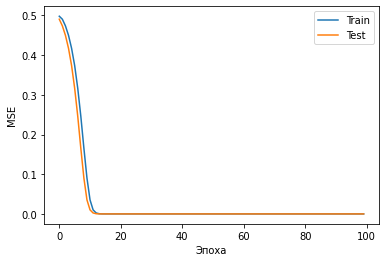

In [ ]:
plt.plot(history.history['loss'],
         label = 'Train')
plt.plot(history.history['val_loss'],
         label = 'Test')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [ ]:
# Возвращаемый объект "history" содержит записи значений потерь и метрик во время обучения

print('\nhistory dict:', history.history)

# Оценим модель на тестовых данных, используя "evaluate"
print('\n Оцениваем на тестовых данных')
results = model.evaluate(x_test, y_test, batch_size=128)
print('test loss, test acc:', results)

# Сгенерируем прогнозы (вероятности - выходные данные последнего слоя)
# на новых данных с помощью "predict"
print('\n Генерируем прогнозы для 3 образцов')
predictions = model.predict(x_test[:3])
print('размерность прогнозов:', predictions.shape)


history dict: {'loss': [0.4978818893432617, 0.49037057161331177, 0.4735925793647766, 0.44970881938934326, 0.41703689098358154, 0.37358933687210083, 0.3165338337421417, 0.24620208144187927, 0.16554971039295197, 0.09026060998439789, 0.0352475568652153, 0.0101711330935359, 0.0023483717814087868, 0.00045144237810745835, 7.634604116901755e-05, 1.1595730939006899e-05, 1.6224638557105209e-06, 2.1471311129062087e-07, 2.7625702614386682e-08, 3.5357468064489694e-09, 4.5533665726793515e-10, 5.942853847917817e-11, 8.113429199319011e-12, 1.1736152414482115e-12, 1.816859515483063e-13, 3.032168903439013e-14, 5.507671226777583e-15, 1.0950942750333659e-15, 2.393873398222671e-16, 5.713536337739755e-17, 1.486098626442356e-17, 4.206582337385344e-18, 1.2929378913408108e-18, 4.3037243088732523e-19, 1.5468234803241283e-19, 5.981898771345002e-20, 2.480344849151582e-20, 1.0986662979130464e-20, 5.179210459741787e-21, 2.5887002991275218e-21, 1.3668109490801752e-21, 7.595733397094144e-22, 4.427443334140754e-22, 

In [ ]:
#Сводка модели

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 1024)              13312     
                                                                 
 dense_16 (Dense)            (None, 512)               524800    
                                                                 
 dense_17 (Dense)            (None, 256)               131328    
                                                                 
 dense_18 (Dense)            (None, 128)               32896     
                                                                 
 dense_19 (Dense)            (None, 64)                8256      
                                                                 
 dense_20 (Dense)            (None, 32)                2080      
                                                                 
 dense_21 (Dense)            (None, 16)               

In [ ]:
#history.history

In [12]:
#model_hist = model.fit(x_train, y_train, epochs=100, verbose=1, validation_split = 0.2)

In [13]:
# plt.plot(model_hist.history['loss'],
#          label = 'Точность Train')
# plt.plot(history.history['val_loss'],
#          label = 'Точность Test')
# plt.xlabel('Эпоха')
# plt.ylabel('Потери')
# plt.legend()
# plt.show()

In [ ]:
model.evaluate(x_test, y_test, verbose=1)

1/1 [==============================] - 0s 22ms/step - loss: 5.4668e-05 - mean_absolute_error: 5.4668e-05


[5.466762377182022e-05, 5.466762377182022e-05]

In [ ]:
MSE = mean_squared_error(y_test, model.predict(x_test.values))
R2 = r2_score(y_test, model.predict(x_test.values))

keras_mlpr_model_errors = pd.DataFrame({'model_name':'Keras_mlpr_model',\
                                    'target_value':['Соотношение матрица/наполнитель'],\
                                    'MSE':[MSE],\
                                    'R2':[R2]})
errors_df = pd.concat([errors_df, keras_mlpr_model_errors], ignore_index=True)
errors_df

1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


,model_name,target_value,MSE,R2
0,Linear Regression_norm,"Модуль упругости при растяжении, ГПа",3.001628e-02,-0.004501
1,Linear Regression_norm,"Прочность при растяжении, МПа",3.333547e-02,-0.010481
2,Linear Regression_standart,"Модуль упругости при растяжении, ГПа",1.061043e+00,-0.004209
3,Linear Regression_standart,"Прочность при растяжении, МПа",1.317042e+00,-0.222225
4,RandomForestRegressor_norm,"Модуль упругости при растяжении, ГПа",2.995715e-02,-0.002522
5,RandomForestRegressor_norm,"Прочность при растяжении, МПа",3.303940e-02,-0.001506
6,RandomForestRegressor_standart,"Модуль упругости при растяжении, ГПа",1.058415e+00,-0.001721
7,RandomForestRegressor_standart,"Прочность при растяжении, МПа",1.076929e+00,0.000602
8,KNeighborsRegressor_norm,"Модуль упругости при растяжении, ГПа",2.988034e-02,0.000049
9,KNeighborsRegressor_norm,"Прочность при растяжении, МПа",3.363911e-02,-0.019685


#Сохранение модели

In [ ]:
model.save('./model')

In [ ]:
reconstructed_model = keras.models.load_model("model")

In [ ]:
reconstructed_model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 1024)              13312     
                                                                 
 dense_16 (Dense)            (None, 512)               524800    
                                                                 
 dense_17 (Dense)            (None, 256)               131328    
                                                                 
 dense_18 (Dense)            (None, 128)               32896     
                                                                 
 dense_19 (Dense)            (None, 64)                8256      
                                                                 
 dense_20 (Dense)            (None, 32)                2080      
                                                                 
 dense_21 (Dense)            (None, 16)               

In [ ]:
import shutil
shutil.make_archive('model', 'zip', 'model')

'/content/model.zip'

# Flask приложение

In [ ]:
from flask import Flask, request, render_template
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense

model = keras.models.load_model("model")
x = np.zeros(9)

app = Flask(__name__)

@app.route('/')
def index():
    return render_template('test1.html', name='Для предсказания результата введите r')

def processing_params(param1, param2, param3, param4, param5, param6, param7, param8, param9 ):
    x[0]=param1
    x[1]=param2
    x[2]=param3
    x[3]=param4
    x[4]=param5
    x[5]=param6
    x[6]=param7
    x[7]=param8
    x[8]=param9
    pred = model.predict(x).flatten()
    message = f"Соотношение матрица-наполнитель равно: {pred}"
    return message


@app.route('/r/', methods=['post', 'get'])
def login():
    message = ''
    if request.method == 'POST':
        param1 = request.form.get('param1')  # запрос к данным формы
        param2 = request.form.get('param2')
        param3 = request.form.get('param3')
        param4 = request.form.get('param4')
        param5 = request.form.get('param5')
        param6 = request.form.get('param6')
        param7 = request.form.get('param7')
        param8 = request.form.get('param8')
        param9 = request.form.get('param9')

        param1 = float(param1)
        param2 = float(param2)
        param3 = float(param3)
        param4 = float(param4)
        param5 = float(param5)
        param6 = float(param6)
        param7 = float(param7)
        param8 = float(param8)
        param9 = float(param9)

        message = processing_params(param1, param2, param3, param4, param5, param6, param7, param8, param9)

    return render_template('login.html', message=message)

if __name__ == '__main__':
    app.run()

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


INFO:werkzeug: * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)
